<a href="https://colab.research.google.com/github/salilathalye/cwa-dphitech-challenge-57/blob/master/dphi_challenge_57_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<H1>Conversations with Austin</H1>
<h2>Binary Classifier Template
<p> Tested with PyCaret 2.2.3
<p>

Wait ... who is Austin, you ask? Austin the Apex Duck is my [Rubber Duck Debug buddy](https:en.wikipedia.org/wiki/Rubber_duck_debugging). Usually a pretty quiet type of guy, but I sense hidden depths of knowledge. Our chats usually start with me staring at something for a long time, then asking a question something like: "Hey Austin, what do you know about Kappa?". His usual response is: "Kappa? Tell me more, please". This usually starts a back and forth dialogue where he eggs (no pun intended!) me on to explain more. He's all about putting things in writing, which is why I'm sitting here taking notes which I'm cataloguing in a series called "Chats with Austin".

Salil Athalye
www.bokehboy.com


Data provided by [DPhi](https://dphi.tech//) Data Sprint #21: Classification of Malware with PE headers
https://dphi.tech/practice/challenge/57


# Configure Environment and Install Packages


In [ ]:
!pip install pycaret==2.2.3 --quiet
!pip install mlflow --quiet
!pip install shap --quiet

# Import Libraries


In [ ]:
from datetime import datetime
from datetime import timezone
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import imblearn
import json
from google.colab import files


# PyCaret
import pycaret
from pycaret.classification import * 
from pycaret.utils import enable_colab
enable_colab()


# MLflow
import mlflow
#TODO: How to set up an MLflow server which we can use with Colab? 
#mlflow.set_tracking_uri('file:/c:/users/mlflow-server')

import shap
#TODO: Not sure how PyCaret sets up shap.initjs() which is required for CoLab.

Colab mode enabled.


# Set Experiment Parameters


In [ ]:
EXPERIMENT_NAME = 'dphi_ch54_1'
SESSION_ID = 3435
DATA_SOURCE = "https://raw.githubusercontent.com/dphi-official/Datasets/master/clamp"
TRAINING_DATA = "train_set_label.csv"
TEST_DATA = "test_set_label.csv"
TARGET_COL = 'class'
# Set this to False when converting this notebook to a Productions script
VERBOSE = True
# Optimize Threshold Costs (only for binary classifiers)
TP_COST = 0
TN_COST = 0
FP_COST = 0
FN_COST = 0
# Hyper-parameter search for model tuning
N_ITER = 10
# Should we download the run artifacts?
DOWNLOAD_ZIPFILE = True

In [ ]:
MODEL = 'TBD' # we will populate this with the best model later

dt = datetime.now()
dt.replace(tzinfo=timezone.utc)
utc_timestamp = dt.replace(tzinfo=timezone.utc).isoformat(timespec='seconds')
# Replace ':' and '-' and retain up to seconds
UTC_TIMESTAMP = utc_timestamp.replace(':','').replace('-',"")[:15]

TRAINING_DATA_PATH = DATA_SOURCE + '/' + TRAINING_DATA
TEST_DATA_PATH = DATA_SOURCE + '/' + TEST_DATA

# Load the data


In [ ]:
# Dataset is provided by DPhi
# raw.githubusercontent.com allows us to download 'raw' content of files stored on github
# NOTE: the training data was most likely saved out without setting index=False, so we need to get rid of the index column on read.
# This is only an issue for the training data file, test data file is fine.
# Credit_History comes in as a float, due to missing values and how pandas manages na_type_promotions
# Source: https://pandas.pydata.org/pandas-docs/stable/user_guide/gotchas.html#na-type-promotions
dtype_mapping = {}
training_index_col = None # specify the zero-indexed column that contains the index, or use None
test_index_col = None

if training_index_col:
  training_data  = pd.read_csv(TRAINING_DATA_PATH, dtype=dtype_mapping, index_col=[training_index_col])
else:
  training_data  = pd.read_csv(TRAINING_DATA_PATH, dtype=dtype_mapping)

if test_index_col:
  test_data = pd.read_csv(TEST_DATA_PATH, dtype=dtype_mapping, index_col=[test_index_col])
else:
  test_data = pd.read_csv(TEST_DATA_PATH, dtype=dtype_mapping)


# Save the raw data in case the source is unavailable later
training_data.to_csv(TRAINING_DATA, index=False)
test_data.to_csv(TEST_DATA, index=False)
# Save any decisions we took on dtype mapping so we can reuse this in other applications
with open('dtype_mapping.json','w') as f:
  json.dump(dtype_mapping, f)

###Data Description
Dataset is related to Portable Executable files for malware detection. There are 55 features in the dataset (excluding target variable). The features consist of 19 image dos headers, 7 file headers and 29 optional headers.

<p>
IMAGE_DOS_HEADER (19)

"e_magic", "e_cblp", "e_cp","e_crlc","e_cparhdr",
"e_minalloc","e_maxalloc","e_ss","e_sp",
"e_csum","e_ip","e_cs","e_lfarlc","e_ovno","e_res",
"e_oemid","e_oeminfo","e_res2","e_lfanew"

<p>
FILE_HEADER (7)

"Machine","NumberOfSections","CreationYear","PointerToSymbolTable",
"NumberOfSymbols","SizeOfOptionalHeader","Characteristics"

<p>
OPTIONAL_HEADER (29)

"Magic", "MajorLinkerVersion", "MinorLinkerVersion", "SizeOfCode", "SizeOfInitializedData", 
"SizeOfUninitializedData", "AddressOfEntryPoint",
"BaseOfCode", "BaseOfData", "ImageBase", "SectionAlignment", "FileAlignment",
"MajorOperatingSystemVersion", "MinorOperatingSystemVersion",
"MajorImageVersion", "MinorImageVersion", "MajorSubsystemVersion",
"MinorSubsystemVersion", "SizeOfImage", "SizeOfHeaders", "CheckSum",
"Subsystem", "DllCharacteristics", "SizeOfStackReserve", "SizeOfStackCommit",
"SizeOfHeapReserve", "SizeOfHeapCommit", "LoaderFlags", "NumberOfRvaAndSizes"

<p>
TARGET_VARIABLE: class - 0 (benign), 1 (malware)

The first field, e_magic, is the so-called magic number. This field is used to identify an MS-DOS-compatible file type. 





In [ ]:
test_data.shape

(1296, 55)

In [ ]:
training_data.shape

(3888, 56)

### Compare Training Data Columns to Test Data Columns

In [ ]:
training_data.columns

Index(['e_magic', 'e_cblp', 'e_cp', 'e_crlc', 'e_cparhdr', 'e_minalloc',
       'e_maxalloc', 'e_ss', 'e_sp', 'e_csum', 'e_ip', 'e_cs', 'e_lfarlc',
       'e_ovno', 'e_res', 'e_oemid', 'e_oeminfo', 'e_res2', 'e_lfanew',
       'Machine', 'NumberOfSections', 'CreationYear', 'PointerToSymbolTable',
       'NumberOfSymbols', 'SizeOfOptionalHeader', 'Characteristics', 'Magic',
       'MajorLinkerVersion', 'MinorLinkerVersion', 'SizeOfCode',
       'SizeOfInitializedData', 'SizeOfUninitializedData',
       'AddressOfEntryPoint', 'BaseOfCode', 'BaseOfData', 'ImageBase',
       'SectionAlignment', 'FileAlignment', 'MajorOperatingSystemVersion',
       'MinorOperatingSystemVersion', 'MajorImageVersion', 'MinorImageVersion',
       'MajorSubsystemVersion', 'MinorSubsystemVersion', 'SizeOfImage',
       'SizeOfHeaders', 'CheckSum', 'Subsystem', 'DllCharacteristics',
       'SizeOfStackReserve', 'SizeOfStackCommit', 'SizeOfHeapReserve',
       'SizeOfHeapCommit', 'LoaderFlags', 'NumberOfRvaAndSiz

In [ ]:
test_data_columns = test_data.columns
training_data_columns = training_data.columns
#Set difference : columns in training_data that are not in test_data
columns_missing_in_test = set(training_data_columns) - set(test_data_columns)
print(columns_missing_in_test)

{'class'}


In [ ]:
training_data.head(5)

,e_magic,e_cblp,e_cp,e_crlc,e_cparhdr,e_minalloc,e_maxalloc,e_ss,e_sp,e_csum,e_ip,e_cs,e_lfarlc,e_ovno,e_res,e_oemid,e_oeminfo,e_res2,e_lfanew,Machine,NumberOfSections,CreationYear,PointerToSymbolTable,NumberOfSymbols,SizeOfOptionalHeader,Characteristics,Magic,MajorLinkerVersion,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,SectionAlignment,FileAlignment,MajorOperatingSystemVersion,MinorOperatingSystemVersion,MajorImageVersion,MinorImageVersion,MajorSubsystemVersion,MinorSubsystemVersion,SizeOfImage,SizeOfHeaders,CheckSum,Subsystem,DllCharacteristics,SizeOfStackReserve,SizeOfStackCommit,SizeOfHeapReserve,SizeOfHeapCommit,LoaderFlags,NumberOfRvaAndSizes,class
0,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,248,332,7,2011,0,0,224,258,267,9,0,0,98816,0,4816,4096,4096,4194304,4096,512,5,0,0,0,5,0,126976,1024,115397,2,33792,1048576,4096,1048576,4096,0,16,1
1,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,256,332,4,2009,0,0,224,271,267,3,6,29696,81920,0,23426,4096,40960,4194304,4096,512,4,0,0,0,4,0,122880,1536,0,2,0,10485760,40960,6291456,16384,0,16,1
2,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,256,332,5,2003,0,0,224,8462,267,7,10,52224,36352,0,50964,4096,57344,2081554432,4096,512,4,0,0,0,4,0,102400,1024,0,2,0,1048576,4096,1048576,4096,0,16,0
3,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,248,332,5,2012,0,0,224,258,267,10,10,77824,67072,0,78808,4096,81920,4194304,4096,512,6,2,6,2,6,0,155648,1024,142244,2,33088,262144,8192,1048576,4096,0,16,0
4,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,192,332,2,2009,0,0,224,8462,267,7,10,0,45056,0,0,4096,4096,268435456,4096,4096,4,0,0,0,4,0,49152,4096,60601,2,1024,1048576,4096,1048576,4096,0,16,0


In [ ]:
training_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3888 entries, 0 to 3887
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   e_magic                      3888 non-null   int64  
 1   e_cblp                       3888 non-null   int64  
 2   e_cp                         3888 non-null   int64  
 3   e_crlc                       3888 non-null   int64  
 4   e_cparhdr                    3888 non-null   int64  
 5   e_minalloc                   3888 non-null   int64  
 6   e_maxalloc                   3888 non-null   int64  
 7   e_ss                         3888 non-null   int64  
 8   e_sp                         3888 non-null   int64  
 9   e_csum                       3888 non-null   int64  
 10  e_ip                         3888 non-null   int64  
 11  e_cs                         3888 non-null   int64  
 12  e_lfarlc                     3888 non-null   int64  
 13  e_ovno            

In [ ]:
training_data.isna().sum()

e_magic                           0
e_cblp                            0
e_cp                              0
e_crlc                            0
e_cparhdr                         0
e_minalloc                        0
e_maxalloc                        0
e_ss                              0
e_sp                              0
e_csum                            0
e_ip                              0
e_cs                              0
e_lfarlc                          0
e_ovno                            0
e_res                          3888
e_oemid                           0
e_oeminfo                         0
e_res2                         3888
e_lfanew                          0
Machine                           0
NumberOfSections                  0
CreationYear                      0
PointerToSymbolTable              0
NumberOfSymbols                   0
SizeOfOptionalHeader              0
Characteristics                   0
Magic                             0
MajorLinkerVersion          

In [ ]:
training_data.describe()

,e_magic,e_cblp,e_cp,e_crlc,e_cparhdr,e_minalloc,e_maxalloc,e_ss,e_sp,e_csum,e_ip,e_cs,e_lfarlc,e_ovno,e_res,e_oemid,e_oeminfo,e_res2,e_lfanew,Machine,NumberOfSections,CreationYear,PointerToSymbolTable,NumberOfSymbols,SizeOfOptionalHeader,Characteristics,Magic,MajorLinkerVersion,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,SectionAlignment,FileAlignment,MajorOperatingSystemVersion,MinorOperatingSystemVersion,MajorImageVersion,MinorImageVersion,MajorSubsystemVersion,MinorSubsystemVersion,SizeOfImage,SizeOfHeaders,CheckSum,Subsystem,DllCharacteristics,SizeOfStackReserve,SizeOfStackCommit,SizeOfHeapReserve,SizeOfHeapCommit,LoaderFlags,NumberOfRvaAndSizes,class
count,3888.0,3888.000000,3888.000000,3888.0,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,0.0,3888.000000,3888.000000,0.0,3888.000000,3888.000000,3888.000000,3888.000000,3.888000e+03,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3.888000e+03,3.888000e+03,3.888000e+03,3.888000e+03,3.888000e+03,3.888000e+03,3.888000e+03,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3888.000000,3.888000e+03,3.888000e+03,3.888000e+03,3888.000000,3888.000000,3.888000e+03,3.888000e+03,3.888000e+03,3888.000000,3.888000e+03,3888.000000,3888.000000
mean,23117.0,148.252058,2.947016,0.0,3.967593,2.120885,65110.442901,16.851852,199.741255,0.001029,14.029064,31.288837,63.572016,1.765432,NaN,0.206019,0.005658,NaN,223.268519,384.580247,4.660751,2008.917953,1.239202e+03,7.509516,224.024691,4617.391975,266.587963,7.561728,5.349537,1.779323e+05,2.839369e+05,5.808479e+04,1.493824e+05,4.180635e+04,2.185558e+05,1.468715e+08,4260.740741,1189.794239,4.617798,0.414609,79.506173,81.317901,4.581790,0.346708,5.606728e+05,4.206932e+03,1.785479e+06,2.132202,9489.058899,2.008231e+06,1.072442e+04,2.065907e+06,5694.156379,3.151187e+04,15.972737,0.517490
std,0.0,591.610421,2.291419,0.0,0.357188,65.785975,5195.740601,1050.777490,1048.231580,0.039275,603.938666,1172.047638,5.216778,6.541826,NaN,7.414758,0.205329,NaN,48.263874,1337.613426,1.897253,6.227255,4.976811e+04,168.864584,0.628135,8221.711981,10.482002,6.927557,10.809528,6.417972e+05,2.319380e+06,8.186598e+05,8.804522e+05,7.758023e+05,1.008604e+06,3.543167e+08,1009.318298,1408.401143,1.016211,0.866976,1301.184638,1431.402935,0.755052,0.779965,2.622193e+06,5.228395e+04,6.906378e+07,0.474741,14841.770405,4.682014e+06,8.256807e+04,4.397444e+06,6510.114435,1.342464e+06,0.648187,0.499758
min,23117.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,NaN,12.000000,332.000000,1.000000,1970.000000,0.000000e+00,0.000000,224.000000,35.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000
25%,23117.0,144.000000,3.000000,0.0,4.000000,0.000000,65535.000000,0.000000,184.000000,0.000000,0.000000,0.000000,64.000000,0.000000,NaN,0.000000,0.000000,NaN,208.000000,332.000000,4.000000,2009.000000,0.000000e+00,0.000000,224.000000,258.000000,267.000000,6.000000,0.000000,1.216000e+04,1.228800e+04,0.000000e+00,7.103750e+03,4.096000e+03,1.638400e+04,4.194304e+06,4096.000000,512.000000,4.000000,0.000000,0.000000,0.000000,4.000000,0.000000,8.192000e+04,1.024000e+03,0.000000e+00,2.000000,0.000000,1.048576e+06,4.096000e+03,1.048576e+06,4096.000000,0.000000e+00,16.000000,0.000000
50%,23117.0,144.000000,3.000000,0.0,4.000000,0.000000,65535.000000,0.000000,184.000000,0.000000,0.000000,0.000000,64.000000,0.000000,NaN,0.000000,0.000000,NaN,232.000000,332.000000,5.000000,2010.000000,0.000000e+00,0.000000,224.000000,271.000000,267.0

In [ ]:
training_data[TARGET_COL].value_counts()

1    2012
0    1876
Name: class, dtype: int64

# Perform Basic Exploratory Data Analysis


# Set up the Experiment
### Notes
* Only set silent=True when you are sure that PyCaret has interpreted the type of each feature correctly. Also remember that if use the default (silent=False), **PyCaret will pause here**, waiting for user confirmation!!!
* When you migrate to Production in the form of a Python script then set html=False.


In [ ]:
experiment = setup(training_data, 
                    target = TARGET_COL, 
                    session_id=SESSION_ID, 
                    ignore_features=['e_res','e_res2'],
                    #numeric_features=[],
                    imputation_type="iterative", 
                    categorical_iterative_imputer="lightgbm", 
                    numeric_iterative_imputer="lightgbm", 
                    iterative_imputation_iters = 5,
                    normalize = True,
                    fix_imbalance = True,
                    fix_imbalance_method = None, # will use SMOTE when set to None
                    fold_strategy='stratifiedkfold',
                    log_experiment = True,       # sets up MLflow using local files
                    log_plots=True,
                    log_data=True,
                    experiment_name = EXPERIMENT_NAME,
                    profile=False,
                    silent=True,                 # set to True only when you confirm feature types selected by PyCaret
                    html=True                  # set to False when converting this to a Production script
                   )

,Description,Value
0,session_id,3435
1,Target,class
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(3888, 56)"
5,Missing Values,True
6,Numeric Features,17
7,Categorical Features,36
8,Ordinal Features,False
9,High Cardinality Features,False


#PyCaret Pipeline
PyCaret creates a Pipeline behind the scenes. Using get_config() we can output a description of the steps in the Pipeline.
<p>
TODO: Figure out how to save the pipeline description to JSON, perhaps?

In [ ]:
prep_pipe = get_config('prep_pipe')

In [ ]:
prep_pipe

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['e_res', 'e_res2'],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Iterative_Imputer(add_indicator=False,
                                   classifier=LGBMClassifier(boosting_type='gbdt',
                                                             class_weight=None,...
                                                  target='class')),
                ('P_transform', 'passthrough'), ('binn', 'passthrough'),
                ('rem_outliers', 'passthrough'), ('cluster_all', 'passthrough'),
                ('dummy', D

# Feature Transformations
Review how PyCaret has transformed Features and the Target looking only at the training data to avoid data leakage.
This is useful when we start developing the front-end and the API so we can be specific on what categorical values are allowed.
<p>
TODO: Seems like we have to infer what transformations were made to each Feature. Would like to see something like col_a was Normalized, col_b was One Hot Encoded etc.

In [ ]:
transformed_training_features = get_config('X_train')

In [ ]:
transformed_training_features.head()

,e_lfanew,CreationYear,Characteristics,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,MajorImageVersion,MinorImageVersion,SizeOfImage,CheckSum,SizeOfStackReserve,SizeOfHeapReserve,e_magic_23117,e_cblp_10,e_cblp_128,e_cblp_144,e_cblp_80,e_cblp_96,e_cp_1,e_cp_2,e_cp_3,e_crlc_0,e_cparhdr_4,e_minalloc_0,e_minalloc_15,e_maxalloc_0,e_sp_184,e_sp_40,e_ip_0,e_lfarlc_0,e_ovno_0,e_oeminfo_6,NumberOfSections_1,NumberOfSections_10,NumberOfSections_11,...,DllCharacteristics_34112,DllCharacteristics_34144,DllCharacteristics_512,DllCharacteristics_64,SizeOfStackCommit_0,SizeOfStackCommit_12288,SizeOfStackCommit_131072,SizeOfStackCommit_16384,SizeOfStackCommit_20480,SizeOfStackCommit_2097152,SizeOfStackCommit_24576,SizeOfStackCommit_262144,SizeOfStackCommit_28672,SizeOfStackCommit_32768,SizeOfStackCommit_36864,SizeOfStackCommit_4096,SizeOfStackCommit_40960,SizeOfStackCommit_49152,SizeOfStackCommit_57344,SizeOfStackCommit_65536,SizeOfStackCommit_69632,SizeOfStackCommit_8192,SizeOfHeapCommit_0,SizeOfHeapCommit_12288,SizeOfHeapCommit_16384,SizeOfHeapCommit_20480,SizeOfHeapCommit_24576,SizeOfHeapCommit_28672,SizeOfHeapCommit_32768,SizeOfHeapCommit_36864,SizeOfHeapCommit_4096,SizeOfHeapCommit_40960,SizeOfHeapCommit_57344,SizeOfHeapCommit_65536,SizeOfHeapCommit_8192,LoaderFlags_0,LoaderFlags_4644397,LoaderFlags_54444254,NumberOfRvaAndSizes_16,NumberOfRvaAndSizes_6
1635,0.338200,0.477332,-0.536590,-0.472503,-0.243090,-0.128156,-0.064439,-0.136790,-0.045747,-0.180078,-0.408414,-0.063113,-0.065115,-0.206419,-0.026813,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2275,-0.658453,0.477332,0.465960,-0.472503,-0.273242,-0.096705,-0.064439,-0.157048,-0.045747,-0.198459,0.354491,-0.068413,-0.065115,-0.190411,-0.025791,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2616,0.504309,0.161394,-0.535121,0.830375,-0.222216,-0.097394,-0.064439,-0.135235,-0.045747,-0.165373,-0.408414,-0.068413,-0.065115,-0.176005,-0.027461,4.111360,0.752095,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2912,-1.987324,0.477332,-0.535243,3.870425,0.147342,-0.122876,-0.064439,-0.152859,-0.045747,0.058881,-0.408414,-0.068413,-0.065115,-0.094366,-0.023250,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
379,0.172091,0.161394,-0.536712,-0.472503,-0.263965,-0.090736,-0.064439,-0.149960,-0.045747,-0.191107,-0.408414,-0.068413,-0.065115,-0.177605,-0.026042,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
transformed_training_features.iloc[0]

e_lfanew                  0.338200
CreationYear              0.477332
Characteristics          -0.536590
MinorLinkerVersion       -0.472503
SizeOfCode               -0.243090
                            ...   
LoaderFlags_0             1.000000
LoaderFlags_4644397       0.000000
LoaderFlags_54444254      0.000000
NumberOfRvaAndSizes_16    1.000000
NumberOfRvaAndSizes_6     0.000000
Name: 1635, Length: 187, dtype: float32

#Evaluate, Select and Tune Model

## Compare Models


In [ ]:
# return best model based on F1
best = compare_models(sort = 'F1', fold=5) #default is 'Accuracy'

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9816,0.9977,0.9878,0.9767,0.9822,0.9632,0.9633,5.516
xgboost,Extreme Gradient Boosting,0.9813,0.9973,0.9871,0.9767,0.9819,0.9625,0.9626,3.490
rf,Random Forest Classifier,0.9809,0.9983,0.9864,0.9767,0.9815,0.9617,0.9619,0.966
lightgbm,Light Gradient Boosting Machine,0.9805,0.9980,0.9864,0.9761,0.9812,0.9610,0.9612,0.478
et,Extra Trees Classifier,0.9765,0.9973,0.9814,0.9730,0.9772,0.9529,0.9530,0.972
gbc,Gradient Boosting Classifier,0.9746,0.9958,0.9785,0.9723,0.9754,0.9492,0.9493,1.150
ada,Ada Boost Classifier,0.9666,0.9946,0.9685,0.9664,0.9675,0.9331,0.9331,0.592
dt,Decision Tree Classifier,0.9621,0.9622,0.9606,0.9655,0.9630,0.9242,0.9243,0.326
knn,K Neighbors Classifier,0.9544,0.9857,0.9628,0.9494,0.9559,0.9088,0.9090,0.804
lr,Logistic Regression,0.9533,0.9859,0.9628,0.9473,0.9549,0.9065,0.9068,0.982


In [ ]:
compare_model_results = pull()
compare_model_results.to_csv('compare_model.csv', index=False)

In [ ]:
TOPN = 3
top_models = compare_models(sort = 'F1', fold=5, n_select=TOPN, turbo=True, exclude=['catboost'])
tuned_top_models = [tune_model(i, n_iter=N_ITER) for i in top_models]
stacked_model = stack_models(tuned_top_models, meta_model=top_models[0], verbose=False)
blended_model = blend_models(tuned_top_models, verbose=False)
finalized_automl_model = automl(optimize = 'F1') # returns a finalized model


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9890,0.9994,0.9857,0.9928,0.9892,0.9780,0.9780
1,0.9816,0.9970,1.0000,0.9653,0.9823,0.9632,0.9638
2,0.9779,0.9991,0.9568,1.0000,0.9779,0.9559,0.9568
3,0.9890,0.9994,0.9928,0.9857,0.9892,0.9779,0.9780
4,0.9853,0.9975,1.0000,0.9722,0.9859,0.9705,0.9710
5,0.9779,0.9977,0.9786,0.9786,0.9786,0.9558,0.9558
6,0.9779,0.9990,0.9786,0.9786,0.9786,0.9558,0.9558
7,0.9816,0.9990,1.0000,0.9655,0.9825,0.9632,0.9638
8,0.9779,0.9967,0.9857,0.9718,0.9787,0.9558,0.9559
9,0.9779,0.9973,0.9714,0.9855,0.9784,0.9559,0.9560


Finished loading model, total used 30 iterations
Finished loading model, total used 30 iterations


In [ ]:
predict_model(stacked_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Stacking Classifier,0.9803,0.9964,0.9854,0.9774,0.9814,0.9604,0.9605


,e_lfanew,CreationYear,Characteristics,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,MajorImageVersion,MinorImageVersion,SizeOfImage,CheckSum,SizeOfStackReserve,SizeOfHeapReserve,e_magic_23117,e_cblp_10,e_cblp_128,e_cblp_144,e_cblp_80,e_cblp_96,e_cp_1,e_cp_2,e_cp_3,e_crlc_0,e_cparhdr_4,e_minalloc_0,e_minalloc_15,e_maxalloc_0,e_sp_184,e_sp_40,e_ip_0,e_lfarlc_0,e_ovno_0,e_oeminfo_6,NumberOfSections_1,NumberOfSections_10,NumberOfSections_11,...,DllCharacteristics_64,SizeOfStackCommit_0,SizeOfStackCommit_12288,SizeOfStackCommit_131072,SizeOfStackCommit_16384,SizeOfStackCommit_20480,SizeOfStackCommit_2097152,SizeOfStackCommit_24576,SizeOfStackCommit_262144,SizeOfStackCommit_28672,SizeOfStackCommit_32768,SizeOfStackCommit_36864,SizeOfStackCommit_4096,SizeOfStackCommit_40960,SizeOfStackCommit_49152,SizeOfStackCommit_57344,SizeOfStackCommit_65536,SizeOfStackCommit_69632,SizeOfStackCommit_8192,SizeOfHeapCommit_0,SizeOfHeapCommit_12288,SizeOfHeapCommit_16384,SizeOfHeapCommit_20480,SizeOfHeapCommit_24576,SizeOfHeapCommit_28672,SizeOfHeapCommit_32768,SizeOfHeapCommit_36864,SizeOfHeapCommit_4096,SizeOfHeapCommit_40960,SizeOfHeapCommit_57344,SizeOfHeapCommit_65536,SizeOfHeapCommit_8192,LoaderFlags_0,LoaderFlags_4644397,LoaderFlags_54444254,NumberOfRvaAndSizes_16,NumberOfRvaAndSizes_6,class,Label,Score
0,-0.990671,-1.418296,0.467429,1.264668,-0.273242,0.044461,-0.064439,-0.157048,-0.045747,-0.198459,0.354491,-0.068413,3.626554,-0.067153,-0.027461,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0.9999
1,0.005983,0.477332,-0.532795,-0.472503,-0.254687,-0.125171,-0.064439,-0.143590,-0.045747,-0.187431,-0.408414,-0.068413,-0.065115,-0.208020,-0.026388,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0.9990
2,0.172091,0.319363,-0.536712,-0.472503,2.183774,0.512336,-0.064439,0.947230,-0.045747,1.264708,-0.408414,-0.065101,-0.064391,9.478157,0.010187,-0.371164,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,0,0.9994
3,1.002636,0.161394,0.438543,-0.472503,-0.273242,-0.130451,-0.064439,-0.157048,-0.050331,-0.202136,-0.420524,-0.068413,-0.065115,-0.222427,-0.027461,-0.425171,-0.476971,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0.9999
4,0.504309,0.003425,-0.535121,-0.125069,-0.226854,-0.089359,-0.064439,-0.135528,-0.045747,-0.169049,-0.408414,-0.068413,-0.065115,-0.168001,-0.027461,0.222905,4.930918,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1162,0.338200,0.003425,-0.535121,0.830375,-0.239225,-0.094639,-0.064439,-0.137929,-0.045747,-0.176402,-0.408414,-0.068413,-0.065115,-0.177605,-0.027461,2.383157,0.75209

In [ ]:
predict_model(blended_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Voting Classifier,0.9803,0.998,0.9935,0.9698,0.9815,0.9604,0.9607


,e_lfanew,CreationYear,Characteristics,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,MajorImageVersion,MinorImageVersion,SizeOfImage,CheckSum,SizeOfStackReserve,SizeOfHeapReserve,e_magic_23117,e_cblp_10,e_cblp_128,e_cblp_144,e_cblp_80,e_cblp_96,e_cp_1,e_cp_2,e_cp_3,e_crlc_0,e_cparhdr_4,e_minalloc_0,e_minalloc_15,e_maxalloc_0,e_sp_184,e_sp_40,e_ip_0,e_lfarlc_0,e_ovno_0,e_oeminfo_6,NumberOfSections_1,NumberOfSections_10,NumberOfSections_11,...,DllCharacteristics_64,SizeOfStackCommit_0,SizeOfStackCommit_12288,SizeOfStackCommit_131072,SizeOfStackCommit_16384,SizeOfStackCommit_20480,SizeOfStackCommit_2097152,SizeOfStackCommit_24576,SizeOfStackCommit_262144,SizeOfStackCommit_28672,SizeOfStackCommit_32768,SizeOfStackCommit_36864,SizeOfStackCommit_4096,SizeOfStackCommit_40960,SizeOfStackCommit_49152,SizeOfStackCommit_57344,SizeOfStackCommit_65536,SizeOfStackCommit_69632,SizeOfStackCommit_8192,SizeOfHeapCommit_0,SizeOfHeapCommit_12288,SizeOfHeapCommit_16384,SizeOfHeapCommit_20480,SizeOfHeapCommit_24576,SizeOfHeapCommit_28672,SizeOfHeapCommit_32768,SizeOfHeapCommit_36864,SizeOfHeapCommit_4096,SizeOfHeapCommit_40960,SizeOfHeapCommit_57344,SizeOfHeapCommit_65536,SizeOfHeapCommit_8192,LoaderFlags_0,LoaderFlags_4644397,LoaderFlags_54444254,NumberOfRvaAndSizes_16,NumberOfRvaAndSizes_6,class,Label,Score
0,-0.990671,-1.418296,0.467429,1.264668,-0.273242,0.044461,-0.064439,-0.157048,-0.045747,-0.198459,0.354491,-0.068413,3.626554,-0.067153,-0.027461,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0.9986
1,0.005983,0.477332,-0.532795,-0.472503,-0.254687,-0.125171,-0.064439,-0.143590,-0.045747,-0.187431,-0.408414,-0.068413,-0.065115,-0.208020,-0.026388,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0.9785
2,0.172091,0.319363,-0.536712,-0.472503,2.183774,0.512336,-0.064439,0.947230,-0.045747,1.264708,-0.408414,-0.065101,-0.064391,9.478157,0.010187,-0.371164,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,0,0.8786
3,1.002636,0.161394,0.438543,-0.472503,-0.273242,-0.130451,-0.064439,-0.157048,-0.050331,-0.202136,-0.420524,-0.068413,-0.065115,-0.222427,-0.027461,-0.425171,-0.476971,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0.9994
4,0.504309,0.003425,-0.535121,-0.125069,-0.226854,-0.089359,-0.064439,-0.135528,-0.045747,-0.169049,-0.408414,-0.068413,-0.065115,-0.168001,-0.027461,0.222905,4.930918,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.9960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1162,0.338200,0.003425,-0.535121,0.830375,-0.239225,-0.094639,-0.064439,-0.137929,-0.045747,-0.176402,-0.408414,-0.068413,-0.065115,-0.177605,-0.027461,2.383157,0.75209

In [ ]:
predict_model(finalized_automl_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.9794,0.9976,0.987,0.9743,0.9806,0.9587,0.9588


,e_lfanew,CreationYear,Characteristics,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,MajorImageVersion,MinorImageVersion,SizeOfImage,CheckSum,SizeOfStackReserve,SizeOfHeapReserve,e_magic_23117,e_cblp_10,e_cblp_128,e_cblp_144,e_cblp_80,e_cblp_96,e_cp_1,e_cp_2,e_cp_3,e_crlc_0,e_cparhdr_4,e_minalloc_0,e_minalloc_15,e_maxalloc_0,e_sp_184,e_sp_40,e_ip_0,e_lfarlc_0,e_ovno_0,e_oeminfo_6,NumberOfSections_1,NumberOfSections_10,NumberOfSections_11,...,DllCharacteristics_64,SizeOfStackCommit_0,SizeOfStackCommit_12288,SizeOfStackCommit_131072,SizeOfStackCommit_16384,SizeOfStackCommit_20480,SizeOfStackCommit_2097152,SizeOfStackCommit_24576,SizeOfStackCommit_262144,SizeOfStackCommit_28672,SizeOfStackCommit_32768,SizeOfStackCommit_36864,SizeOfStackCommit_4096,SizeOfStackCommit_40960,SizeOfStackCommit_49152,SizeOfStackCommit_57344,SizeOfStackCommit_65536,SizeOfStackCommit_69632,SizeOfStackCommit_8192,SizeOfHeapCommit_0,SizeOfHeapCommit_12288,SizeOfHeapCommit_16384,SizeOfHeapCommit_20480,SizeOfHeapCommit_24576,SizeOfHeapCommit_28672,SizeOfHeapCommit_32768,SizeOfHeapCommit_36864,SizeOfHeapCommit_4096,SizeOfHeapCommit_40960,SizeOfHeapCommit_57344,SizeOfHeapCommit_65536,SizeOfHeapCommit_8192,LoaderFlags_0,LoaderFlags_4644397,LoaderFlags_54444254,NumberOfRvaAndSizes_16,NumberOfRvaAndSizes_6,class,Label,Score
0,-0.990671,-1.418296,0.467429,1.264668,-0.273242,0.044461,-0.064439,-0.157048,-0.045747,-0.198459,0.354491,-0.068413,3.626554,-0.067153,-0.027461,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0.9898
1,0.005983,0.477332,-0.532795,-0.472503,-0.254687,-0.125171,-0.064439,-0.143590,-0.045747,-0.187431,-0.408414,-0.068413,-0.065115,-0.208020,-0.026388,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0.9078
2,0.172091,0.319363,-0.536712,-0.472503,2.183774,0.512336,-0.064439,0.947230,-0.045747,1.264708,-0.408414,-0.065101,-0.064391,9.478157,0.010187,-0.371164,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,0,0.9362
3,1.002636,0.161394,0.438543,-0.472503,-0.273242,-0.130451,-0.064439,-0.157048,-0.050331,-0.202136,-0.420524,-0.068413,-0.065115,-0.222427,-0.027461,-0.425171,-0.476971,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0.9945
4,0.504309,0.003425,-0.535121,-0.125069,-0.226854,-0.089359,-0.064439,-0.135528,-0.045747,-0.169049,-0.408414,-0.068413,-0.065115,-0.168001,-0.027461,0.222905,4.930918,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.9969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1162,0.338200,0.003425,-0.535121,0.830375,-0.239225,-0.094639,-0.064439,-0.137929,-0.045747,-0.176402,-0.408414,-0.068413,-0.065115,-0.177605,-0.027461,2.383157,0.75209

In [ ]:
finalized_stacked_model = finalize_model(stacked_model)
finalized_blended_model = finalize_model(blended_model)

Finished loading model, total used 30 iterations
Finished loading model, total used 30 iterations


In [ ]:
BLENDED_MODEL = 'blended'
FINAL_BLENDED_MODEL_NAME_WITH_TS = EXPERIMENT_NAME + '_' + BLENDED_MODEL + '_' + UTC_TIMESTAMP
FINAL_BLENDED_MODEL_NAME_WITHOUT_TS = EXPERIMENT_NAME + '_' + BLENDED_MODEL
save_model(finalized_blended_model, FINAL_BLENDED_MODEL_NAME_WITHOUT_TS)
save_model(finalized_blended_model, FINAL_BLENDED_MODEL_NAME_WITH_TS)
batch_prediction_blended = predict_model(finalized_blended_model, data=test_data)
submission = batch_prediction_blended[['Label']]
submission.rename(columns={'Label':'prediction'}, inplace=True)
submission.index = test_data.index
submission.to_csv('prediction_results_blended.csv', index=False)

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Succesfully Saved


In [ ]:
STACKED_MODEL = 'stacked'
FINAL_STACKED_MODEL_NAME_WITH_TS = EXPERIMENT_NAME + '_' + STACKED_MODEL + '_' + UTC_TIMESTAMP
FINAL_STACKED_MODEL_NAME_WITHOUT_TS = EXPERIMENT_NAME + '_' + STACKED_MODEL
save_model(finalized_stacked_model, FINAL_STACKED_MODEL_NAME_WITHOUT_TS)
save_model(finalized_stacked_model, FINAL_STACKED_MODEL_NAME_WITH_TS)
batch_prediction_stacked = predict_model(finalized_stacked_model, data=test_data)
submission = batch_prediction_stacked[['Label']]
submission.rename(columns={'Label':'prediction'}, inplace=True)
submission.index = test_data.index
submission.to_csv('prediction_results_stacked.csv', index=False)

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Succesfully Saved


In [ ]:
AUTOML_MODEL = 'automl'
FINAL_AUTOML_MODEL_NAME_WITH_TS = EXPERIMENT_NAME + '_' + AUTOML_MODEL + '_' + UTC_TIMESTAMP
FINAL_AUTOML_MODEL_NAME_WITHOUT_TS = EXPERIMENT_NAME + '_' + AUTOML_MODEL
save_model(finalized_automl_model, FINAL_AUTOML_MODEL_NAME_WITHOUT_TS)
save_model(finalized_automl_model, FINAL_AUTOML_MODEL_NAME_WITH_TS)
batch_prediction_automl = predict_model(finalized_automl_model, data=test_data)
submission = batch_prediction_automl[['Label']]
submission.rename(columns={'Label':'prediction'}, inplace=True)
submission.index = test_data.index
submission.to_csv('prediction_results_automl.csv', index=False)

Transformation Pipeline and Model Succesfully Saved
Transformation Pipeline and Model Succesfully Saved


## Select the Base Model
### Notes for Austin
* Austin, when we want to study the decision boundaries that are established by different types of models, we can use create_model to run these experiments.

### Do your research!
* Is there a way to take the output from compare_models() and feed it into create model? Looks like compare_models() returns an object, whereas create_model needs a model identifier as a str.
* Future iteration, let's get a top N set of models that we can use for a bagging,blending,stacking foray! What would be a good criteria for going down this path? Can we establish a parallel path, or perhaps a choice?

In [ ]:
# Get the name of the best model, based on criteria provided above
MODEL = compare_model_results.index[0]

In [ ]:
# train base model
base_model = create_model(MODEL, verbose=True)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9927,0.9990,0.9929,0.9929,0.9929,0.9853,0.9853
1,0.9816,0.9979,1.0000,0.9653,0.9823,0.9632,0.9638
2,0.9779,0.9990,0.9784,0.9784,0.9784,0.9559,0.9559
3,0.9890,0.9989,0.9928,0.9857,0.9892,0.9779,0.9780
4,0.9853,0.9987,1.0000,0.9722,0.9859,0.9705,0.9710
5,0.9779,0.9986,0.9857,0.9718,0.9787,0.9558,0.9559
6,0.9890,0.9994,0.9857,0.9928,0.9892,0.9779,0.9780
7,0.9743,0.9989,0.9929,0.9586,0.9754,0.9484,0.9491
8,0.9779,0.9955,0.9857,0.9718,0.9787,0.9558,0.9559
9,0.9816,0.9951,0.9714,0.9927,0.9819,0.9632,0.9635


In [ ]:
create_model_results = pull()
create_model_results.to_csv('create_model.csv', index=False)

## Tune the Model


In [ ]:

optimized_threshold = optimize_threshold(base_model, true_negative=TN_COST, false_negative=FN_COST, true_positive=TP_COST, false_positive=TN_COST)
print(optimized_threshold)


Optimized Probability Threshold: 0.0 | Optimized Cost Function: 0
0.0


In [ ]:
optimized_threshold_results = {'TP_COST': TP_COST, 'TN_COST': TN_COST, 'FP_COST': FP_COST, 'FN_COST': FN_COST, 'OPT_THRESHOLD': optimized_threshold}
with open("optimized_threshold_results.json",'w') as f:
  json.dump(optimized_threshold_results, f)

In [ ]:
# tune hyperparameters to optimize F1
tuned_model = tune_model(base_model, optimize = 'F1', n_iter=N_ITER)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9927,0.9983,0.9929,0.9929,0.9929,0.9853,0.9853
1,0.9853,0.9970,1.0000,0.9720,0.9858,0.9706,0.9710
2,0.9816,0.9989,0.9784,0.9855,0.9819,0.9632,0.9632
3,0.9816,0.9980,0.9856,0.9786,0.9821,0.9632,0.9632
4,0.9853,0.9978,1.0000,0.9722,0.9859,0.9705,0.9710
5,0.9779,0.9984,0.9786,0.9786,0.9786,0.9558,0.9558
6,0.9816,0.9991,0.9857,0.9787,0.9822,0.9632,0.9632
7,0.9816,0.9978,0.9929,0.9720,0.9823,0.9632,0.9634
8,0.9779,0.9946,0.9857,0.9718,0.9787,0.9558,0.9559
9,0.9779,0.9959,0.9714,0.9855,0.9784,0.9559,0.9560


In [ ]:
tune_model_results = pull()
tune_model_results.to_csv('tune_model.csv', index=False)

## Review Model Diagnostics
### Notes for Austin
* This is where we need to spend some quality time. Surfacing the insights from a set of runs to inform our next choices. Especially true when you are running complex models on cloud clusters --- the $$$ start to rack up.
* Let's invest in a deep study of these plots and formulate an approach

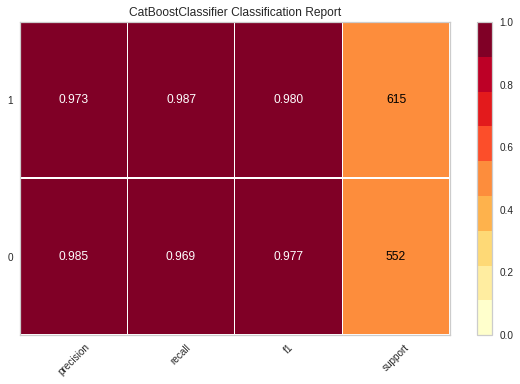

In [ ]:
plot_model(tuned_model, plot = 'class_report')

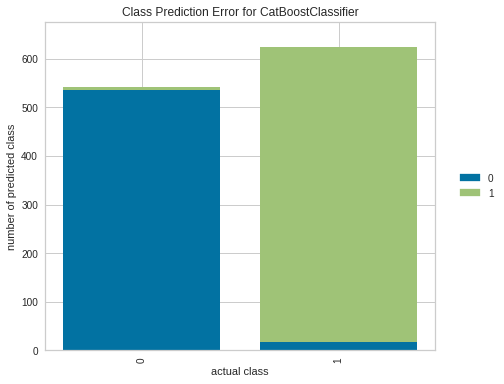

In [ ]:
plot_model(tuned_model, plot='error')

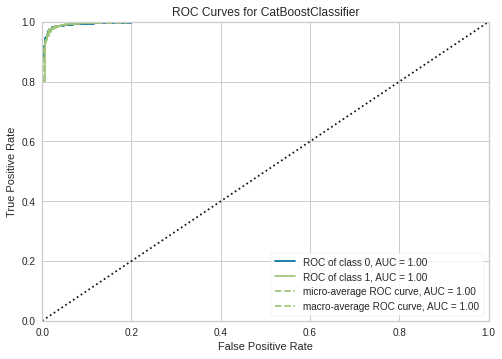

In [ ]:
#plot a model
plot_model(tuned_model, plot='auc')

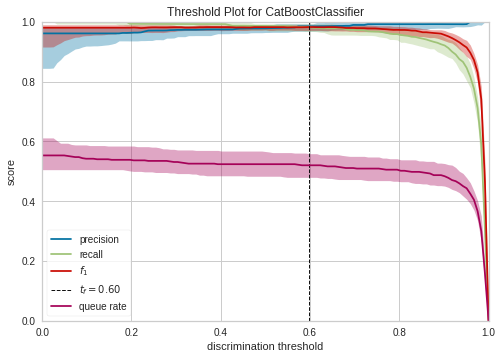

In [ ]:
plot_model(tuned_model, plot='threshold')

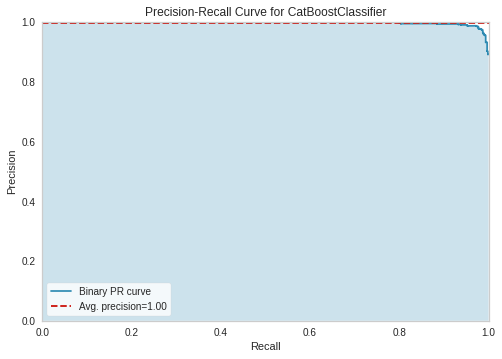

In [ ]:
plot_model(tuned_model, plot = 'pr')

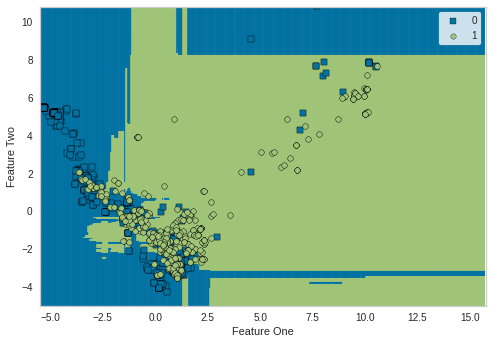

In [ ]:
plot_model(tuned_model, plot='boundary')

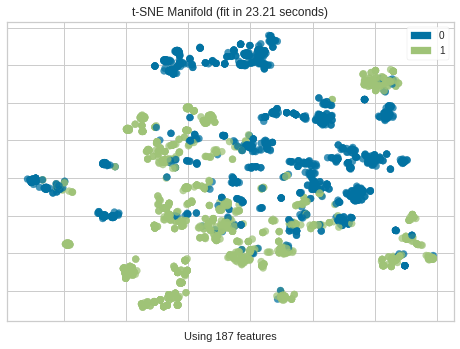

In [ ]:
plot_model(tuned_model, plot='manifold')

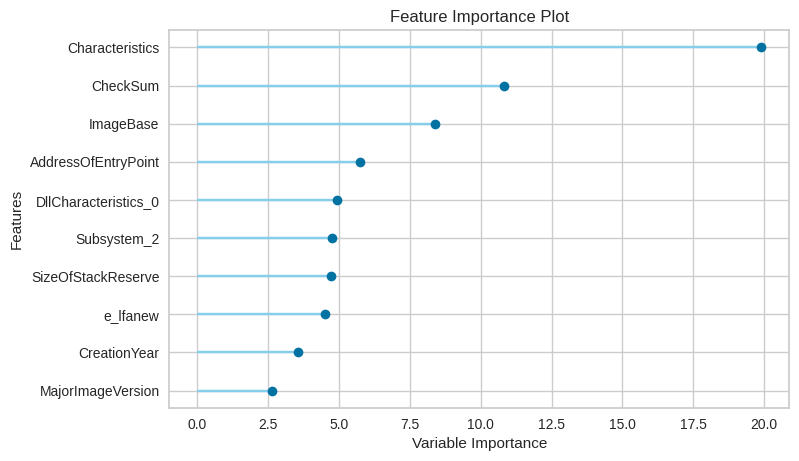

In [ ]:

plot_model(tuned_model, plot='feature')

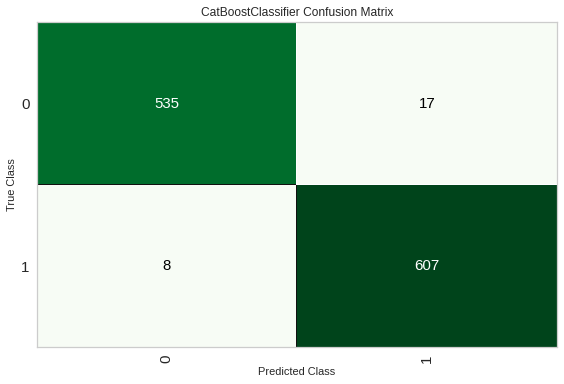

In [ ]:
plot_model(tuned_model, plot = 'confusion_matrix')

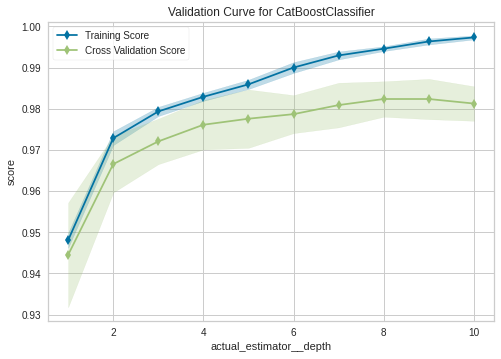

In [ ]:
plot_model(tuned_model, plot='vc')

In [ ]:
predict_model(tuned_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.9786,0.9974,0.987,0.9728,0.9798,0.957,0.9571


,e_lfanew,CreationYear,Characteristics,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,MajorImageVersion,MinorImageVersion,SizeOfImage,CheckSum,SizeOfStackReserve,SizeOfHeapReserve,e_magic_23117,e_cblp_10,e_cblp_128,e_cblp_144,e_cblp_80,e_cblp_96,e_cp_1,e_cp_2,e_cp_3,e_crlc_0,e_cparhdr_4,e_minalloc_0,e_minalloc_15,e_maxalloc_0,e_sp_184,e_sp_40,e_ip_0,e_lfarlc_0,e_ovno_0,e_oeminfo_6,NumberOfSections_1,NumberOfSections_10,NumberOfSections_11,...,DllCharacteristics_64,SizeOfStackCommit_0,SizeOfStackCommit_12288,SizeOfStackCommit_131072,SizeOfStackCommit_16384,SizeOfStackCommit_20480,SizeOfStackCommit_2097152,SizeOfStackCommit_24576,SizeOfStackCommit_262144,SizeOfStackCommit_28672,SizeOfStackCommit_32768,SizeOfStackCommit_36864,SizeOfStackCommit_4096,SizeOfStackCommit_40960,SizeOfStackCommit_49152,SizeOfStackCommit_57344,SizeOfStackCommit_65536,SizeOfStackCommit_69632,SizeOfStackCommit_8192,SizeOfHeapCommit_0,SizeOfHeapCommit_12288,SizeOfHeapCommit_16384,SizeOfHeapCommit_20480,SizeOfHeapCommit_24576,SizeOfHeapCommit_28672,SizeOfHeapCommit_32768,SizeOfHeapCommit_36864,SizeOfHeapCommit_4096,SizeOfHeapCommit_40960,SizeOfHeapCommit_57344,SizeOfHeapCommit_65536,SizeOfHeapCommit_8192,LoaderFlags_0,LoaderFlags_4644397,LoaderFlags_54444254,NumberOfRvaAndSizes_16,NumberOfRvaAndSizes_6,class,Label,Score
0,-0.990671,-1.418296,0.467429,1.264668,-0.273242,0.044461,-0.064439,-0.157048,-0.045747,-0.198459,0.354491,-0.068413,3.626554,-0.067153,-0.027461,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0.9728
1,0.005983,0.477332,-0.532795,-0.472503,-0.254687,-0.125171,-0.064439,-0.143590,-0.045747,-0.187431,-0.408414,-0.068413,-0.065115,-0.208020,-0.026388,-0.209146,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0.8678
2,0.172091,0.319363,-0.536712,-0.472503,2.183774,0.512336,-0.064439,0.947230,-0.045747,1.264708,-0.408414,-0.065101,-0.064391,9.478157,0.010187,-0.371164,-0.231158,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,0,0.9302
3,1.002636,0.161394,0.438543,-0.472503,-0.273242,-0.130451,-0.064439,-0.157048,-0.050331,-0.202136,-0.420524,-0.068413,-0.065115,-0.222427,-0.027461,-0.425171,-0.476971,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0.9795
4,0.504309,0.003425,-0.535121,-0.125069,-0.226854,-0.089359,-0.064439,-0.135528,-0.045747,-0.169049,-0.408414,-0.068413,-0.065115,-0.168001,-0.027461,0.222905,4.930918,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.9956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1162,0.338200,0.003425,-0.535121,0.830375,-0.239225,-0.094639,-0.064439,-0.137929,-0.045747,-0.176402,-0.408414,-0.068413,-0.065115,-0.177605,-0.027461,2.383157,0.75209

##Interpret Model Predictions
<p>
If you are viewing this notebook on github, the next set of plots will not render as they require Javascript. SHAP interpretation

In [ ]:
shap_models = ['xgboost', 'rf', 'catboost', 'et', 'lightgbm', 'dt']
run_shap = True if MODEL in shap_models else False
print(f'Cannot run SHAP model interpretation for {MODEL}' if run_shap == False else 'Running SHAP model interpretation. Plots require Javascript and may not render on github')

Running SHAP model interpretation. Plots require Javascript and may not render on github


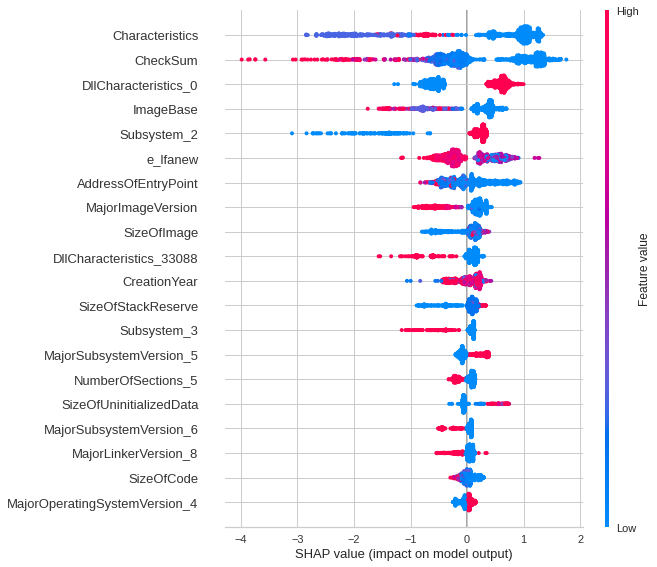

In [ ]:
if run_shap:
  interpret_model(tuned_model)

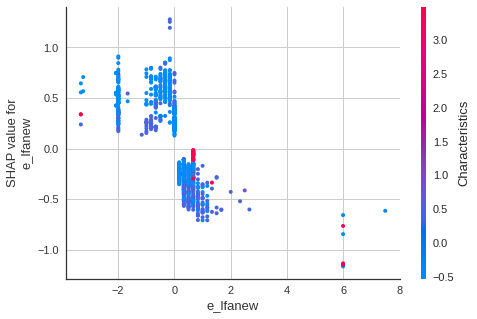

In [ ]:
if run_shap:
  interpret_model(tuned_model, plot='correlation')

In [ ]:
#if run_shap:
#  interpret_model(tuned_model, plot='correlation', feature='ImageBase')

In [ ]:
#if run_shap:
#  interpret_model(tuned_model, plot='correlation', feature='CoapplicantIncome')

In [ ]:
interpret_model(tuned_model, plot='reason')

In [ ]:
i = 77
interpret_model(tuned_model, plot='reason', observation = i)

-0.26888163756534356


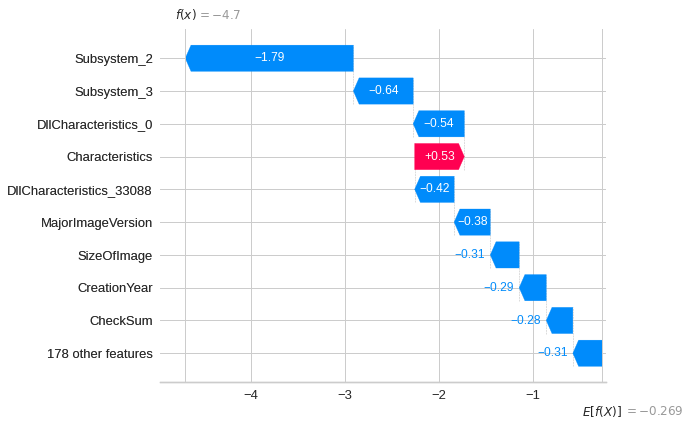

In [ ]:
explainer = shap.TreeExplainer(tuned_model)
base_value = explainer.expected_value[0]
print(base_value)
shap_values = explainer.shap_values(transformed_training_features)
i = 77
values = shap_values[i,:]
features = transformed_training_features.columns
data = transformed_training_features.iloc[i,:]
# There is curently a bug in waterfall_plot, see
# https://github.com/slundberg/shap/issues/1420
# This is a workaround.
shap.plots._waterfall.waterfall_legacy(explainer.expected_value, shap_values[0], feature_names=features)

In [ ]:
evaluate_model(tuned_model)

,Parameters
nan_mode,Min
eval_metric,Logloss
iterations,280
sampling_frequency,PerTree
leaf_estimation_method,Newton
grow_policy,SymmetricTree
penalties_coefficient,1
boosting_type,Plain
model_shrink_mode,Constant
feature_border_type,GreedyLogSum


## Finalize the Model

In [ ]:
final_model = finalize_model(tuned_model)

In [ ]:
print(final_model)

In [ ]:
FINAL_MODEL_NAME_WITH_TS = EXPERIMENT_NAME + '_' + MODEL + '_' + UTC_TIMESTAMP
FINAL_MODEL_NAME_WITHOUT_TS = EXPERIMENT_NAME + '_' + MODEL

* Not sure if there are issues with putting a timestamp or a file name length constraint for cloud environments. I recall that Azure Machine Learning had an experiment name string length limit. For now, I will save the model again with a simple file name without the timestamp.

In [ ]:
save_model(final_model, FINAL_MODEL_NAME_WITHOUT_TS)

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['e_res', 'e_res2'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='class',
                                       time_features=[])),
                 ('imputer',
                  Iterative_Imputer(add_indicator=False,
                                    classifier=LGBMClassifier(boosting_type='gbdt',
                                                              class_weight=None,...
                 ('rem_outliers', 'passthrough'), ('cluster_all', 'passthrough'),
                 ('dummy', Dummify(target='class')),
                 ('fix_perfect', Remove_100(target='class')),
                 ('clean_names', Clean_

In [ ]:
save_model(final_model, FINAL_MODEL_NAME_WITH_TS)

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['e_res', 'e_res2'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='class',
                                       time_features=[])),
                 ('imputer',
                  Iterative_Imputer(add_indicator=False,
                                    classifier=LGBMClassifier(boosting_type='gbdt',
                                                              class_weight=None,...
                 ('rem_outliers', 'passthrough'), ('cluster_all', 'passthrough'),
                 ('dummy', Dummify(target='class')),
                 ('fix_perfect', Remove_100(target='class')),
                 ('clean_names', Clean_

In [ ]:
!ls

catboost_info				  logs.log
compare_model.csv			  mlruns
create_model.csv			  optimized_threshold_results.json
dphi_ch54_1_automl_20210117T000253.pkl	  prediction_results_automl.csv
dphi_ch54_1_automl.pkl			  prediction_results_blended.csv
dphi_ch54_1_blended_20210117T000253.pkl   prediction_results_stacked.csv
dphi_ch54_1_blended.pkl			  sample_data
dphi_ch54_1_catboost_20210117T000253.pkl  sweet_viz_training_eda.html
dphi_ch54_1_catboost.pkl		  test_set_label.csv
dphi_ch54_1_stacked_20210117T000253.pkl   train_set_label.csv
dphi_ch54_1_stacked.pkl			  tune_model.csv
dtype_mapping.json


# Load Model and Predict


In [ ]:
loaded_model = load_model(FINAL_MODEL_NAME_WITHOUT_TS)

Transformation Pipeline and Model Successfully Loaded


In [ ]:
loaded_model

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['e_res', 'e_res2'],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='class',
                                      time_features=[])),
                ('imputer',
                 Iterative_Imputer(add_indicator=False,
                                   classifier=LGBMClassifier(boosting_type='gbdt',
                                                             class_weight=None,...
                ('rem_outliers', 'passthrough'), ('cluster_all', 'passthrough'),
                ('dummy', Dummify(target='class')),
                ('fix_perfect', Remove_100(target='class')),
                ('clean_names', Clean_Colum_Names()),
 

In [ ]:
single_example = test_data.iloc[[1],:]

In [ ]:
single_example.head()

,e_magic,e_cblp,e_cp,e_crlc,e_cparhdr,e_minalloc,e_maxalloc,e_ss,e_sp,e_csum,e_ip,e_cs,e_lfarlc,e_ovno,e_res,e_oemid,e_oeminfo,e_res2,e_lfanew,Machine,NumberOfSections,CreationYear,PointerToSymbolTable,NumberOfSymbols,SizeOfOptionalHeader,Characteristics,Magic,MajorLinkerVersion,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,SectionAlignment,FileAlignment,MajorOperatingSystemVersion,MinorOperatingSystemVersion,MajorImageVersion,MinorImageVersion,MajorSubsystemVersion,MinorSubsystemVersion,SizeOfImage,SizeOfHeaders,CheckSum,Subsystem,DllCharacteristics,SizeOfStackReserve,SizeOfStackCommit,SizeOfHeapReserve,SizeOfHeapCommit,LoaderFlags,NumberOfRvaAndSizes
1,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,128,332,5,2009,0,0,224,271,267,7,10,4096,2977792,2506752,4356,4096,8192,4194304,4096,4096,4,0,0,0,4,0,2985984,4096,0,2,0,1048576,4096,1048576,4096,0,16


In [ ]:
single_example.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 1 to 1
Data columns (total 55 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   e_magic                      1 non-null      int64  
 1   e_cblp                       1 non-null      int64  
 2   e_cp                         1 non-null      int64  
 3   e_crlc                       1 non-null      int64  
 4   e_cparhdr                    1 non-null      int64  
 5   e_minalloc                   1 non-null      int64  
 6   e_maxalloc                   1 non-null      int64  
 7   e_ss                         1 non-null      int64  
 8   e_sp                         1 non-null      int64  
 9   e_csum                       1 non-null      int64  
 10  e_ip                         1 non-null      int64  
 11  e_cs                         1 non-null      int64  
 12  e_lfarlc                     1 non-null      int64  
 13  e_ovno                  

In [ ]:
prediction = predict_model(loaded_model, data= single_example)

In [ ]:
prediction

,e_magic,e_cblp,e_cp,e_crlc,e_cparhdr,e_minalloc,e_maxalloc,e_ss,e_sp,e_csum,e_ip,e_cs,e_lfarlc,e_ovno,e_res,e_oemid,e_oeminfo,e_res2,e_lfanew,Machine,NumberOfSections,CreationYear,PointerToSymbolTable,NumberOfSymbols,SizeOfOptionalHeader,Characteristics,Magic,MajorLinkerVersion,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,SectionAlignment,FileAlignment,MajorOperatingSystemVersion,MinorOperatingSystemVersion,MajorImageVersion,MinorImageVersion,MajorSubsystemVersion,MinorSubsystemVersion,SizeOfImage,SizeOfHeaders,CheckSum,Subsystem,DllCharacteristics,SizeOfStackReserve,SizeOfStackCommit,SizeOfHeapReserve,SizeOfHeapCommit,LoaderFlags,NumberOfRvaAndSizes,Label,Score
1,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,128,332,5,2009,0,0,224,271,267,7,10,4096,2977792,2506752,4356,4096,8192,4194304,4096,4096,4,0,0,0,4,0,2985984,4096,0,2,0,1048576,4096,1048576,4096,0,16,1,0.9898


In [ ]:
batch_prediction = predict_model(loaded_model, data=test_data)

In [ ]:
batch_prediction

,e_magic,e_cblp,e_cp,e_crlc,e_cparhdr,e_minalloc,e_maxalloc,e_ss,e_sp,e_csum,e_ip,e_cs,e_lfarlc,e_ovno,e_res,e_oemid,e_oeminfo,e_res2,e_lfanew,Machine,NumberOfSections,CreationYear,PointerToSymbolTable,NumberOfSymbols,SizeOfOptionalHeader,Characteristics,Magic,MajorLinkerVersion,MinorLinkerVersion,SizeOfCode,SizeOfInitializedData,SizeOfUninitializedData,AddressOfEntryPoint,BaseOfCode,BaseOfData,ImageBase,SectionAlignment,FileAlignment,MajorOperatingSystemVersion,MinorOperatingSystemVersion,MajorImageVersion,MinorImageVersion,MajorSubsystemVersion,MinorSubsystemVersion,SizeOfImage,SizeOfHeaders,CheckSum,Subsystem,DllCharacteristics,SizeOfStackReserve,SizeOfStackCommit,SizeOfHeapReserve,SizeOfHeapCommit,LoaderFlags,NumberOfRvaAndSizes,Label,Score
0,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,232,332,6,2011,0,0,224,259,267,9,0,4096,13824,0,4800,4096,8192,4194304,4096,512,5,0,0,0,5,0,32768,1024,0,2,32768,1048576,4096,1048576,4096,0,16,1,0.9817
1,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,128,332,5,2009,0,0,224,271,267,7,10,4096,2977792,2506752,4356,4096,8192,4194304,4096,4096,4,0,0,0,4,0,2985984,4096,0,2,0,1048576,4096,1048576,4096,0,16,1,0.9898
2,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,184,332,2,2012,0,0,224,8462,267,7,10,0,9216,0,0,4096,4096,268435456,4096,512,4,0,0,0,4,0,20480,512,54759,2,1024,1048576,4096,1048576,4096,0,16,0,0.9957
3,23117,80,2,0,4,15,65535,0,184,0,0,0,64,26,NaN,0,0,NaN,256,332,8,1992,0,0,224,33166,267,2,25,334336,71680,0,338164,4096,339968,4194304,4096,512,4,0,0,0,4,0,434176,1024,0,2,0,1048576,16384,1048576,4096,0,16,1,0.9845
4,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,232,332,5,2012,0,0,224,258,267,10,10,7680,105472,0,10324,4096,12288,4194304,4096,512,6,2,6,2,6,2,126976,1024,148592,2,33088,262144,8192,1048576,4096,0,16,0,0.9969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1291,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,216,332,6,2010,0,0,224,258,267,9,0,6656,84480,0,7420,4096,12288,4194304,4096,512,5,0,0,0,5,0,110592,1024,124681,2,1088,1048576,4096,1048576,4096,0,16,1,0.9952
1292,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,272,332,5,2012,0,0,224,8450,267,8,0,11784192,757760,0,2384779,4096,11788288,268435456,4096,4096,4,0,0,0,4,0,12599296,4096,12574710,2,256,1048576,4096,1048576,4096,0,16,0,0.9978
1293,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,240,34404,6,2011,0,0,240,8226,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.9865
1294,23117,144,3,0,4,0,65535,0,184,0,0,0,64,0,NaN,0,0,NaN,128,332,4,2012,0,0,224,258,267,8,0,55808,4096,0,63694,8192,65536,4194304,8192,512,4,0,0,0,4,0,90112,1024,123584,2,34112,1048576,4096,1048576,4096,0,16,0,0.8698


In [ ]:
submission = batch_prediction[['Label']]
submission.rename(columns={'Label':'prediction'}, inplace=True)
submission.index = test_data.index
submission.to_csv('prediction_results.csv', index=False)

In [ ]:
logs = get_logs(save=True)
logs.head()

,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.AUC,metrics.Recall,metrics.TT,metrics.F1,metrics.Prec.,metrics.MCC,metrics.Accuracy,metrics.Kappa,params.model_shrink_rate,params.random_strength,params.task_type,params.score_function,params.posterior_sampling,params.border_count,params.grow_policy,params.use_best_model,params.bayesian_matrix_reg,params.boost_from_average,params.boosting_type,params.subsample,params.model_size_reg,params.model_shrink_mode,params.sparse_features_conflict_fraction,params.nan_mode,params.leaf_estimation_backtracking,params.leaf_estimation_method,params.sampling_frequency,params.auto_class_weights,params.classes_count,params.learning_rate,params.loss_function,params.min_data_in_leaf,params.best_model_min_trees,params.rsm,...,params.Shuffle Train-Test,params.Remove Multicollinearity,params.Label Encoded,params.Unknown Categoricals Handling,params.Features Selection Threshold,params.Rare Level Threshold,params.Transformed Test Set,params.session_id,params.High Cardinality Features,params.Categorical Features,params.Polynomial Threshold,params.Experiment Name,params.Transformed Train Set,params.Transformation Method,params.Numeric Imputer,params.Fold Generator,params.Use GPU,params.Clustering Iteration,params.Group Features,params.Feature Interaction,params.Target,params.Transformation,params.Ignore Low Variance,params.Clustering,params.Remove Outliers,params.Stratify Train-Test,params.Iterative Imputation Categorical Model,params.Numeric Binning,params.Ordinal Features,params.Log Experiment,tags.URI,tags.mlflow.user,tags.Run Time,tags.mlflow.log-model.history,tags.mlflow.runName,tags.mlflow.source.name,tags.Source,tags.USI,tags.mlflow.source.type,tags.Run ID
0,0a602d5e67ac4db9bc43d59012b0ed96,1,FINISHED,file:///content/mlruns/1/0a602d5e67ac4db9bc43d...,2021-01-17 01:13:59.149000+00:00,2021-01-17 01:14:00.656000+00:00,0.998400,0.987100,5.35,0.983400,0.979800,0.96560,0.982800,0.965500,0,0.6000000238418579,CPU,Cosine,False,254,SymmetricTree,False,0.10000000149011612,False,Plain,0.800000011920929,0.5,Constant,0,Min,AnyImprovement,Newton,PerTree,None,0,0.029999999329447743,Logloss,1,1,1,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,5b0a55fb,root,53.7,"[{""run_id"": ""0a602d5e67ac4db9bc43d59012b0ed96""...",CatBoost Classifier,/usr/local/lib/python3.6/dist-packages/ipykern...,finalize_model,ffa6,LOCAL,0a602d5e67ac4db9bc43d59012b0ed96
1,050d0c7f4fbe4633b2f3b8fb5f0c0862,1,FINISHED,file:///content/mlruns/1/050d0c7f4fbe4633b2f3b...,2021-01-17 01:02:15.182000+00:00,2021-01-17 01:02:16.667000+00:00,0.997600,0.987100,4.76,0.982900,0.978800,0.96480,0.982400,0.964700,0,0.6000000238418579,CPU,Cosine,False,254,SymmetricTree,False,0.10000000149011612,False,Plain,0.800000011920929,0.5,Constant,0,Min,AnyImprovement,Newton,PerTree,None,0,0.029999999329447743,Logloss,1,1,1,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,540a0e8b,root,218.59,"[{""run_id"": ""050d0c7f4fbe4633b2f3b8fb5f0c0862""...",CatBoost Classifier,/usr/local/lib/python3.6/dist-packages/ipykern...,tune_model,ffa6,LOCAL,050d0c7f4fbe4633b2f3b8fb5f0c0862
2,e328416c27aa432987fdd2ec6969d924,1,FINISHED,file:///content/mlruns/1/e328416c27aa432987fdd...,2021-01-17 00:58:33.261000+00:00,2021-01-17 00:58:34.646000+00:00,0.998096,0.988551,6.41,0.983285,0.978228,0.96563,0.982723,0.965408,0,1,CPU,Cosine,False,254,SymmetricTree,False,0.10000000149011612,False,Plain,0.800000011920929,0.5,Constant,0,Min,AnyImprovement,Newton,PerTree,None,0,0.01597600057721138,Logloss,1,1,1,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,a7fd02c2,root,64.07,"[{""run_id"": ""e328416c27aa432987fdd2ec6969d924""...",CatBoost Classifier,/usr/local/lib/python3.

# Capture Schema Information



In [ ]:
import json

def schema_to_json(df, filename_prefix):
  '''
  Adapted from
  Source: https://stackoverflow.com/questions/50422404/save-and-export-dtypes-information-of-a-python-pandas-dataframe
  '''
  columns_filename = filename_prefix + '_columns.json'
  df.head(0).to_json(columns_filename)

  tmp = df.dtypes.to_frame('dtypes').reset_index()
  df_dtypes = tmp.set_index('index')['dtypes'].astype(str).to_dict()
  dtypes_filename = filename_prefix + '_dtypes.json'
  with open(dtypes_filename, 'w') as f:
    json.dump(df_dtypes, f)

In [ ]:
schema_to_json(training_data, 'training_data')
schema_to_json(test_data, 'test_data')

# Capture Package Versions


In [ ]:
'''
Adapted from
Source: https://stackoverflow.com/questions/40428931/package-for-listing-version-of-packages-used-in-a-jupyter-notebook
'''
package_versions = {m.__name__ : m.__version__ for m in globals().values() if getattr(m, '__version__', None)}
with open('notebook_package_versions.json','w') as f:
  json.dump(package_versions, f)

# Bundle Outputs and Download

In [ ]:
# Google Colab places a folder of sample data in sample_data. We don't need that.
!rm -rf sample_data ||:

In [ ]:
ZIP_ARCHIVE_NAME = FINAL_MODEL_NAME_WITH_TS + '.zip'

In [ ]:
!zip -qr ./$ZIP_ARCHIVE_NAME ./

In [ ]:
if DOWNLOAD_ZIPFILE:
  files.download(ZIP_ARCHIVE_NAME)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>